In [24]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import efficientnet.keras as efn 
import librosa
import librosa.display as display
import os
import matplotlib.pyplot as plt
import matplotlib
from PIL import Image
from sklearn.utils import class_weight
import warnings
from tqdm import tqdm

%matplotlib inline

!rm -r train_data
!rm -r val_data
!rm -r models
!mkdir models

## Visualizing Mel-Spectrogram of an audio

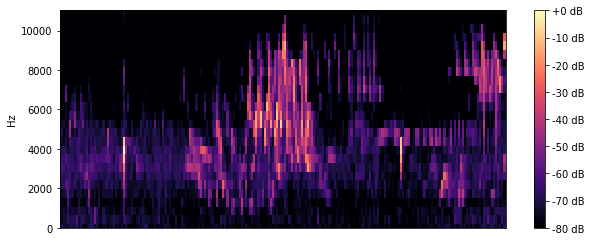

In [26]:
SOUND_DIR = "/project/data/birdsong-recognition/train_audio/"
bird_type = "aldfly"

signal, sr = librosa.load(os.path.join(SOUND_DIR, bird_type, "XC134874.mp3"), duration=10)

# Plot mel-spectrogram
N_FFT = 1024
HOP_SIZE = 1024
N_MELS = 26
WIN_SIZE = 1024
WINDOW_TYPE = 'hann'
FEATURE = 'mel'
FMIN = 1400

S = librosa.feature.melspectrogram(y=signal,sr=sr,
                                    n_fft=N_FFT,
                                    hop_length=HOP_SIZE, 
                                    n_mels=N_MELS, 
                                    htk=True, 
                                    fmin=FMIN, 
                                    fmax=sr/2) 

plt.figure(figsize=(10, 4))
display.specshow(librosa.power_to_db(S**2, ref=np.max), fmin=FMIN, y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.show()

## Create Mel-Spectrogram for training

In [28]:
def createMelSpectrogram(input_path, fileName, output_path):
    
    signal, sr = librosa.load(os.path.join(input_path, fileName), duration=10)
    
    N_FFT = 1024         
    HOP_SIZE = 1024       
    #N_MELS = 128            
    N_MELS = 26
    WIN_SIZE = 1024      
    WINDOW_TYPE = 'hann' 
    FEATURE = 'mel'      
    FMIN = 1400 

    S = librosa.feature.melspectrogram(y=signal,sr=sr, n_fft=N_FFT,
                                       hop_length=HOP_SIZE, 
                                       n_mels=N_MELS, 
                                       htk=True, 
                                       fmin=FMIN, 
                                       fmax=sr/2) 

    fig = plt.figure(frameon=False)
    fig.set_size_inches(10,4)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    p = display.specshow(librosa.power_to_db(S**2, ref=np.max), fmin=FMIN, y_axis='linear')
    fig.savefig(os.path.join(output_path, fileName.split(".")[0] + ".png"))
    #matplotlib.image.imsave(os.path.join(output_path, fileName.split(".")[0] + ".png"), S)

In [29]:
# suppress warnings
warnings.filterwarnings("ignore")

# list of birds
BIRDS = ["aldfly", "ameavo", "amebit", "amecro", "amegfi",
         "amekes", "amepip", "amered", "amerob", "amewig"]

if not os.path.exists("train_data/"): os.mkdir("train_data/")
if not os.path.exists("val_data/"): os.mkdir("val_data/")

100%|██████████| 10/10 [17:24<00:00, 104.49s/it]


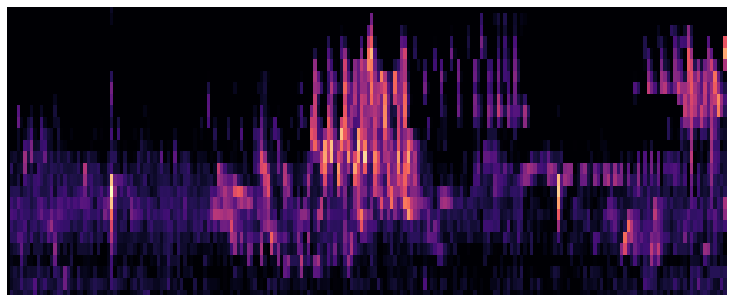

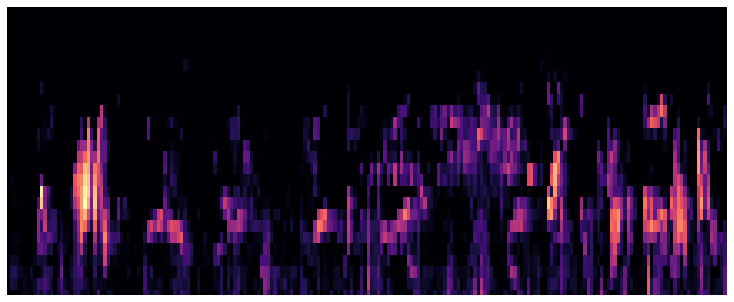

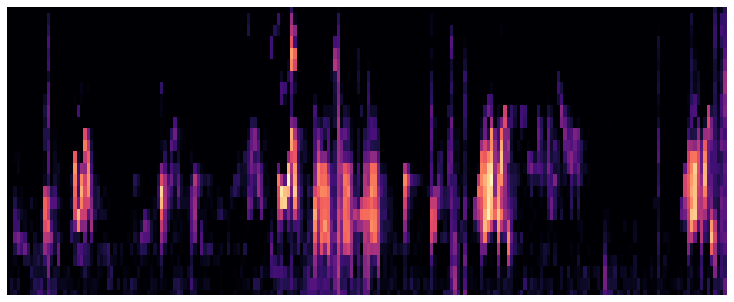

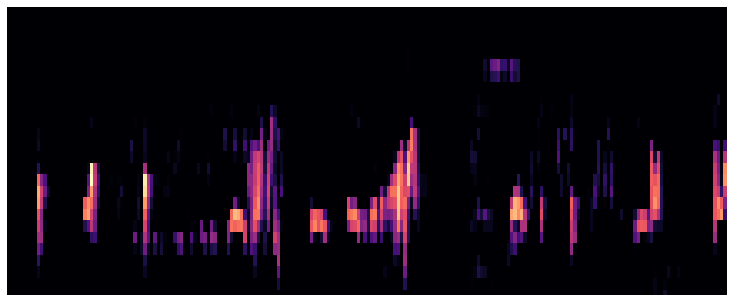

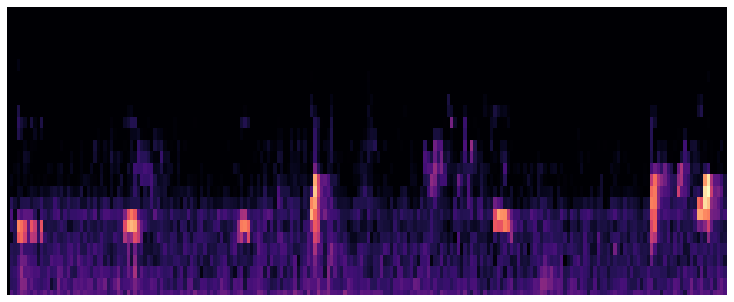

...

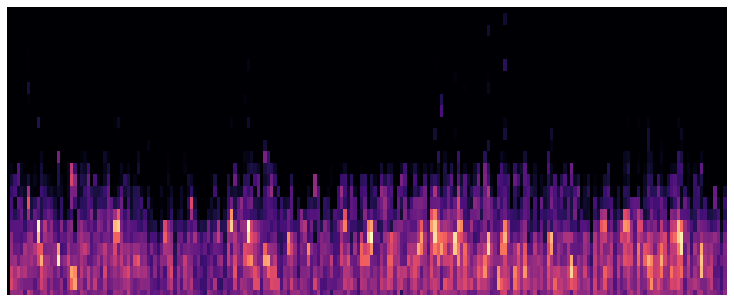

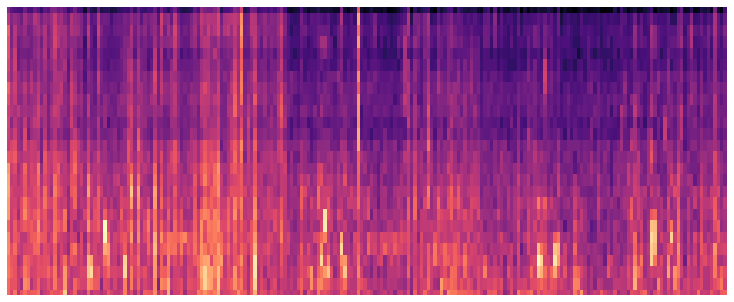

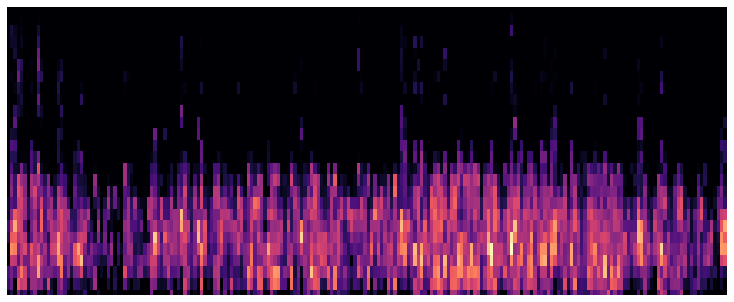

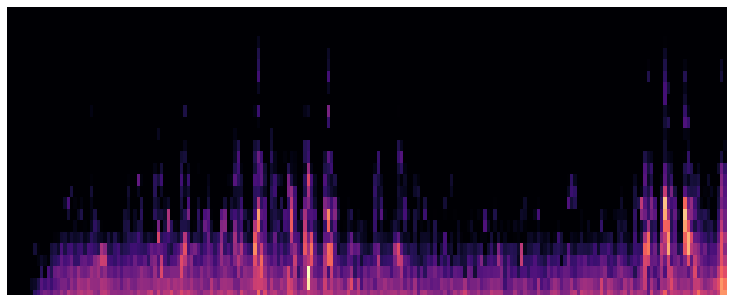

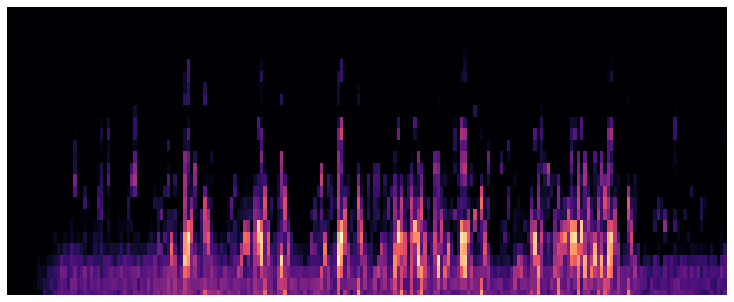

In [30]:
### This takes long time to run ###

# create train and val spectrogram
np.random.seed(1234)
for bird in tqdm(BIRDS):
    INPUT_DIR = os.path.join("data/birdsong-recognition/train_audio/", bird)
    TRAIN_DIR = os.path.join("train_data/", bird)
    VAL_DIR = os.path.join("val_data/", bird)
    
    # create folders
    if not(os.path.exists(TRAIN_DIR)): os.mkdir(TRAIN_DIR)
    if not(os.path.exists(VAL_DIR)): os.mkdir(VAL_DIR)

    # split into train and val set
    for f in os.listdir(INPUT_DIR):
        rand = np.random.randint(0, 10)
        if f[0] != ".":
            if rand <= 7: 
                createMelSpectrogram(INPUT_DIR, f, TRAIN_DIR)
            else:
                createMelSpectrogram(INPUT_DIR, f, VAL_DIR)

In [31]:
IM_SIZE = (224,224,3)
BATCH_SIZE = 16

In [32]:
train_datagen = ImageDataGenerator(preprocessing_function=None,
                                   rescale=1/255,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.1,
                                   fill_mode='nearest')

train_batches = train_datagen.flow_from_directory("train_data/",
                                                  classes=BIRDS, 
                                                  target_size=IM_SIZE[0:2], 
                                                  class_mode='categorical', 
                                                  shuffle=True, batch_size=BATCH_SIZE)

val_datagen = ImageDataGenerator(preprocessing_function=None, rescale=1/255)

val_batches = train_datagen.flow_from_directory("val_data/",
                                                  classes=BIRDS, 
                                                  target_size=IM_SIZE[0:2], 
                                                  class_mode='categorical', 
                                                  shuffle=False, batch_size=1)

Found 632 images belonging to 10 classes.
Found 158 images belonging to 10 classes.


In [33]:
net = efn.EfficientNetB3(include_top=False, weights="imagenet", input_tensor=None, input_shape=IM_SIZE)
#net.trainable = False

x = net.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
#x = tf.keras.layers.GlobalMaxPool2D()(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.5)(x)

output_layer = tf.keras.layers.Dense(len(BIRDS), activation='softmax', name='softmax')(x)
net_final = tf.keras.Model(inputs=net.input, outputs=output_layer)

net_final.compile(optimizer=tf.keras.optimizers.Adam(), 
                  loss='categorical_crossentropy', metrics=['accuracy'])

In [34]:
net_final.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 112, 112, 40) 1080        input_3[0][0]                    
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (None, 112, 112, 40) 160         stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (None, 112, 112, 40) 0           stem_bn[0][0]                    
____________________________________________________________________________________________

In [35]:
ModelCheck = tf.keras.callbacks.ModelCheckpoint('models/efficientnet_checkpoint.h5', monitor='val_loss', verbose=0, 
                             save_best_only=True, save_weights_only=True, mode='auto', save_freq=1)

net_final.reset_states()
net_final.fit_generator(train_batches, 
                        validation_data=val_batches,
                        steps_per_epoch = int(len(train_batches.classes)/BATCH_SIZE)+1,
                        validation_steps=len(val_batches.classes),
                        epochs=15,
                       callbacks=[ModelCheck])

Epoch 1/15
40/40 [==============================] - 13s 334ms/step - loss: 1.7737 - accuracy: 0.3797 - val_loss: 2.2079 - val_accuracy: 0.2722
Epoch 2/15
40/40 [==============================] - 11s 281ms/step - loss: 1.3024 - accuracy: 0.5902 - val_loss: 2.1093 - val_accuracy: 0.4620
Epoch 3/15
40/40 [==============================] - 10s 261ms/step - loss: 1.1046 - accuracy: 0.6614 - val_loss: 2.6985 - val_accuracy: 0.3987
Epoch 4/15
40/40 [==============================] - 11s 281ms/step - loss: 0.9015 - accuracy: 0.7009 - val_loss: 1.8945 - val_accuracy: 0.5000
Epoch 5/15
40/40 [==============================] - 11s 279ms/step - loss: 0.9040 - accuracy: 0.7120 - val_loss: 1.8910 - val_accuracy: 0.3987
Epoch 6/15
40/40 [==============================] - 11s 278ms/step - loss: 0.7598 - accuracy: 0.7611 - val_loss: 1.7338 - val_accuracy: 0.5443
Epoch 7/15
40/40 [==============================] - 11s 278ms/step - loss: 0.5926 - accuracy: 0.8180 - val_loss: 1.1296 - val_accuracy: 0.6772

In [36]:
net_final.load_weights('models/efficientnet_checkpoint.h5')
print("Accuracy on val data")
net_final.evaluate(val_batches, steps=len(val_batches.classes))[1]

Accuracy on val data
158/158 [==============================] - 2s 14ms/step - loss: 0.8238 - accuracy: 0.7911


0.7911392450332642